# !!!! ATTENTION !!!!
# ! Press TRUST in the upper right corner !
! Only then you will see rendered EDA analitycs ! <br>
(it's a html cells with some jscript sp you need to press that to see the cell's output) <br>
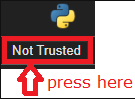

##### compatibility imports...

In [ ]:
!pip install scikit-learn==1.2.2
!pip install eli5
!pip install --upgrade pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 22.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107721 sha256=012d8cb42be354b5a04d60f47e4fae921d5dad35e15ed1d20a8e19ae2d0fe2d2
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 72.3 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.1.4
    Uninstalling pandas-2.1.4:
      Successfully uninstalled pandas-2.1.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. Thi

***
# Introduction
***
**Goal**
<br> the goal of the current task is to:
* check your way of thought
* analytical thinking and skills
* ability to adapt to the new provided data
* practical usage of your Data Science skills

**Input**
You are provided with the file called “data.csv”. That file contains a sample of real-world data. The structure of the file is the following:
* Date – the date in YYYY-MM-DD format, stating the day of recording the feature’s values;
* Columns 1..4 - feature columns;
* Column “target” – target.

**Task**
1.	Perform the `data cleansing` and handling of the `missing values`.
2.	Build an `EDA`.
3.	Apply the statistical, multicollinear, correlational, or lag analysis between the columns to find the possible relationships.
4.	Using the information above and your knowledge of algorithms, design or build a system for forecasting the “target” variable `10 consecutive days ahead`. The `accuracy of the built model will not be evaluated as much as your selected approach for the task`. You are not obligated to use all of the data provided.

***
# Understanding
***
1. **Problem**<br>
It looks like we have more interest to show a workshop of understanding everything than build a SOTA model.

We have few independent variables (predictors).<br>
At first glance we have a multiple regression (multivariaBLE) problem.<br>
But we have been asked to forecast 10 days into the future.<br>
"A few steps ahead" may be achieved with different strategies (no free cookies, people tried different approaches):<br>
<br>
1) Direct Multi-step Forecast Strategy:<br><font size="2">
We have full control here over modelling, but it's unscalable wrt many time-steps and tends to have high variance<br>
Separate model for each time-step<br>
Same data</font>
```
p(t+1) = m1(x(t-0),x(t-1),...,x(t-n))
p(t+2) = m2(x(t-0),x(t-1),...,x(t-n))
```
2) Recursive Multi-step Forecast Strategy:<br><font size="2">
Scalable but errors in forecast tend to accumulate with each timestep (biased, drifts)<br>
Autoregresive<br>
One model used<br>
For each next time-step the input data is shifted: last point is dropped, previous prediction is added</font>
```
p(t+1) = m1(x(t-0),x(t-1),...,x(t-n))
p(t+2) = m1(p(t+1),x(t-0),...,x(t-n+1))
```
3) Direct-Recursive Hybrid Strategy:<br><font size="2">
Again unscalable, but helps to stabilize the errors (both variance and bias)<br>
Hybrid Autoregresive<br>
Separate models used<br>
For each next time-step the input data is shifted: last point is dropped, previous prediction is added</font>
```
p(t+1) = m1(x(t-0),x(t-1),...,x(t-n))
p(t+2) = m2(p(t+1),x(t-0),...,x(t-n+1))
```
4) Multiple Output Strategy:<br><font size="2">
Hard to scale, longer to train, but usualy best results<br>
Using one model and unchanged data we make a few predictions at once:</font>
```
[p(t+1),p(t+2)] = m1(x(t-0),x(t-1),...,x(t-n))
```

<br>**I think we have a kind of multivariate multiple regression here and might use 1st or 4th strategy**.<br>
<br>

2. **Data**: We have one file of data to work with. Will need to preprocess it and to analyze how to use it better.<br>


# Data importing + quality inspection

In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/OpenMineral/')

Mounted at /content/drive


***
"data (1).csv" as "df_0", Raw data processing/cleaning
***

In [ ]:
## let's have a look at the start of the file to be able to determine the parsing rules (e.g. which separator?)
with open('data (1).csv','rt') as f:
  print(repr(f.read(1000)))

'Date,1,2,3,4,target\n1990-01-02,,,,17.24,1.062\n1990-01-03,,,,18.19,1.0965\n1990-01-04,,,,19.22,1.0855\n1990-01-05,,,,20.11,1.095\n1990-01-08,,,,20.26,1.1135\n1990-01-09,,,,22.20,1.102\n1990-01-10,,,,22.44,1.081\n1990-01-11,,,,20.05,1.092\n1990-01-12,,,,24.64,1.059\n1990-01-15,,,,26.34,1.04\n1990-01-16,,,,24.18,1.045\n1990-01-17,,,,24.16,1.04\n1990-01-18,,,,24.34,1.0235\n1990-01-19,,,,22.50,0.993\n1990-01-22,,,,26.70,0.9875\n1990-01-23,,,,24.72,0.9745\n1990-01-24,,,,25.39,0.966\n1990-01-25,,,,25.63,0.977\n1990-01-26,,,,26.28,0.9835\n1990-01-29,,,,26.44,0.9675\n1990-01-30,,,,27.25,0.9565\n1990-01-31,,,,25.36,0.986\n1990-02-01,3179.2,,8.24,24.87,0.977\n1990-02-02,,,,24.32,1.0005\n1990-02-05,,,,24.54,0.987\n1990-02-06,,,,24.69,0.992\n1990-02-07,,,,24.29,1.0005\n1990-02-08,,,,23.77,0.9975\n1990-02-09,,,,23.69,1.0125\n1990-02-12,,,,24.38,0.999\n1990-02-13,,,,23.76,1.042\n1990-02-14,,,,22.05,1.057\n1990-02-15,,,,19.71,1.0705\n1990-02-16,,,,20.78,1.1135\n1990-02-20,,,,22.78,1.13\n1990-02-21,

***
separator = ',' (normal)<br>
and looks like everything else pandas also can handle
***

In [ ]:
df_0 = pd.read_csv('data (1).csv') #,sep=',')
print(df_0.head().to_string() )

         Date   1   2   3      4  target
0  1990-01-02 NaN NaN NaN  17.24  1.0620
1  1990-01-03 NaN NaN NaN  18.19  1.0965
2  1990-01-04 NaN NaN NaN  19.22  1.0855
3  1990-01-05 NaN NaN NaN  20.11  1.0950
4  1990-01-08 NaN NaN NaN  20.26  1.1135


In [ ]:
# reusables
def f_df_check(df:pd.DataFrame, values_length_trshld)->pd.DataFrame:
    s1 = df.isna().agg(['sum']).rename({'sum':'NA'}).T
    s2 = (~df.isna()).agg(['sum']).rename({'sum':'not-NA'}).T
    s3 = (s1['NA']/(s1['NA']+s2['not-NA']) *100).apply(lambda x: round(x,1))
    s3 = s3.rename('NA %').to_frame()
    res = \
    pd.concat([df.dtypes.to_frame('dtype'),
               df.nunique().to_frame('nunique'),
               s1, s2, s3,
               (df=='').agg(['sum']).rename({'sum':'empty'}).T,
               df.applymap(lambda x: len(str(x))<values_length_trshld).agg(['sum']).rename({'sum':f'length<{values_length_trshld}'}).T,
              ],
              axis=1
             )
    return res

In [ ]:
df = df_0.copy()
print('custom checks'); print(f_df_check(df, 2).to_string(),'\n')
print('DataFrame.describe()'); print(df.describe(),'\n')

custom checks
          dtype  nunique    NA  not-NA  NA %  empty  length<2
Date     object     8280     0    8280   0.0      0         0
1       float64      253  8027     253  96.9      0         0
2       float64     1032  7248    1032  87.5      0         0
3       float64      157  8027     253  96.9      0         0
4        object     2591     1    8279   0.0      0        13
target  float64     4825     0    8280   0.0      0         0 

DataFrame.describe()
                  1             2           3       target
count    253.000000  1.032000e+03  253.000000  8280.000000
mean    8609.864032  3.399187e+06    2.693043     2.109078
std     5203.592194  2.352797e+06    2.369522     1.192973
min     3179.200000  7.128090e+05    0.050000     0.606000
25%     4203.800000  8.832900e+05    0.180000     0.985875
50%     6917.100000  2.928502e+06    2.190000     2.049750
75%    11928.900000  4.466912e+06    5.210000     3.159500
max    21703.800000  8.965487e+06    8.290000     4.93750

<ipython-input-6-fbe353e3e137>:12: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df.applymap(lambda x: len(str(x))<values_length_trshld).agg(['sum']).rename({'sum':f'length<{values_length_trshld}'}).T,


***
Some strange thing with feature '4'. We have digits, but it seems that it has been read as string object and we've got some values of length less than 2.. let's check it
***

In [ ]:
print(df['4'][df['4'].apply(lambda v:len(str(v)))<2].to_string())

292     .
1780    .
1988    .
2935    .
2936    .
5710    .
5711    .
7244    .
7937    .
8015    .
8056    .
8095    .
8275    .


***
Might be some problem in data pipe used or built-in catch.<br>
So, we've seen that:
1. feature-columns '1','2','3','4' basetype is float
2. we have probability that we may get some strange values unconvertible to float

Let's write a function that will cover such a probability by overwriting such values to NaN. In real life I would also investigate and improve the data pipe from which we receive this data.
***

In [ ]:
import numpy as np

In [ ]:
def f_data_preprocessing_to_floats(df:pd.DataFrame)->pd.DataFrame:
  def f_try_float(x):
    try:
      return float(x)
    except:
      return np.nan
  return df.applymap(f_try_float).astype('float')

In [ ]:
# send a copy to function, make changes on the copy, return changed copy, assign result to the source
df[['1','2','3','4']] = f_data_preprocessing_to_floats(df[['1','2','3','4']])

<ipython-input-10-de4fe589f1b4>:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  return df.applymap(f_try_float).astype('float')


***
let's check new stats
***

In [ ]:
print('custom checks'); print(f_df_check(df, 2).to_string(),'\n')
print('DataFrame.describe()'); print(df.describe(),'\n')

custom checks
          dtype  nunique    NA  not-NA  NA %  empty  length<2
Date     object     8280     0    8280   0.0      0         0
1       float64      253  8027     253  96.9      0         0
2       float64     1032  7248    1032  87.5      0         0
3       float64      157  8027     253  96.9      0         0
4       float64     2502    14    8266   0.2      0         0
target  float64     4825     0    8280   0.0      0         0 

DataFrame.describe()
                  1             2           3            4       target
count    253.000000  1.032000e+03  253.000000  8266.000000  8280.000000
mean    8609.864032  3.399187e+06    2.693043    19.662642     2.109078
std     5203.592194  2.352797e+06    2.369522     7.984975     1.192973
min     3179.200000  7.128090e+05    0.050000     9.140000     0.606000
25%     4203.800000  8.832900e+05    0.180000    13.880000     0.985875
50%     6917.100000  2.928502e+06    2.190000    17.820000     2.049750
75%    11928.900000  4.46

<ipython-input-6-fbe353e3e137>:12: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df.applymap(lambda x: len(str(x))<values_length_trshld).agg(['sum']).rename({'sum':f'length<{values_length_trshld}'}).T,


***
Now next column. Date.<br>
We have 8280 unique Date values in 8280 rows. I think we safe to convert it from string object to DateTime (it would be useful further if we will need to extract cyclic dt features)
***

In [ ]:
print(df['Date'].iloc[:10].to_string())

0    1990-01-02
1    1990-01-03
2    1990-01-04
3    1990-01-05
4    1990-01-08
5    1990-01-09
6    1990-01-10
7    1990-01-11
8    1990-01-12
9    1990-01-15


In [ ]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

In [ ]:
print('custom checks'); print(f_df_check(df, 2).to_string(),'\n')
print('DataFrame.describe()'); print(df.describe(),'\n')

custom checks


<ipython-input-6-fbe353e3e137>:12: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df.applymap(lambda x: len(str(x))<values_length_trshld).agg(['sum']).rename({'sum':f'length<{values_length_trshld}'}).T,


                 dtype  nunique    NA  not-NA  NA %  empty  length<2
Date    datetime64[ns]     8280     0    8280   0.0      0         0
1              float64      253  8027     253  96.9      0         0
2              float64     1032  7248    1032  87.5      0         0
3              float64      157  8027     253  96.9      0         0
4              float64     2502    14    8266   0.2      0         0
target         float64     4825     0    8280   0.0      0         0 

DataFrame.describe()
                                Date             1             2           3  \
count                           8280    253.000000  1.032000e+03  253.000000   
mean   2006-07-11 11:07:59.999999872   8609.864032  3.399187e+06    2.693043   
min              1990-01-02 00:00:00   3179.200000  7.128090e+05    0.050000   
25%              1998-03-29 06:00:00   4203.800000  8.832900e+05    0.180000   
50%              2006-07-13 12:00:00   6917.100000  2.928502e+06    2.190000   
75%           

***
Thoughts about features<br>
1. Features '1','2','3' are almost undefined (NA%:96.9,87.5,96.9) I strongly doubt that we can use them. Empirical norm is that NA% must be below 50% to make some usefull imputances.
2. Feature '4' will be good with a little imputance (NA%:0.2)
3. Feature 'Date' is dates for 12 yrs and fully defined and since we are doubting in features in p.1 we can extract cyclical features from Date (dow,dom,doq,doy,wom,woq,woy,moy,moq,qoy)
4. Target is also fully defined and can be used as lag-features (previous steps wrt forecast)
***

***
Also.. since we've just got Date formatted.. let's look at the words in the task precisely. We have been asked to forecast '10 **consecutive days** ahead'. "Consecutive days" means to me the sequence of a successive dates. Without any gaps within. But to measure forecast quality we then need an example in the data provided of such a sequence of 10 dates wo gaps to compare forecasted Target to actual. And having that then interpolate all data in gaps in precceeding data to that to train model on.<br>
**If we will find such a sequence - then it would me more professional to compare to it. But if we would not find such an example - then we will downgrade the formulation of the task to "consecutive steps" (and no need to worry about interpolation of date gaps, we will work with the data as provided)**
<br>*We could trick this out a bit by first expand by missing dates, then do imputing between dates by sequence of filling (pandas DataFrame.resample() method) steps in order: mean->forward->backward. But in my opinion it's cheating and breaks the purity of test step. But it's possible. It's like to decide: "what do we want to forecast for prices (the target) on weekdays when markets are closed? If the price is constant on weekdays coz of absence of trading then probably it's better to not to forecast such values but rather forecast price on trading days?". It depends. In a case of currencies trading we have Over-the-counter (off-exchange) trading so prices are changing even when the big exchanges are closed. But again to forecast in such a fashion we would need to have at least one example in our data of prices without gaps to measure the quality of our forecasting model. We can cheat as described, but rather not to.*
***

In [ ]:
# sort by dates. just to be safe here and after with all sequential ops.
df.sort_values(by='Date',inplace=True)
df.reset_index(drop=True, inplace=True)
print(df.head().to_string())

        Date   1   2   3      4  target
0 1990-01-02 NaN NaN NaN  17.24  1.0620
1 1990-01-03 NaN NaN NaN  18.19  1.0965
2 1990-01-04 NaN NaN NaN  19.22  1.0855
3 1990-01-05 NaN NaN NaN  20.11  1.0950
4 1990-01-08 NaN NaN NaN  20.26  1.1135


In [ ]:
# add column that represents the difference in days between next and current row
df['daydif'] = -df['Date'].diff(-1).dt.days

In [ ]:
print(df.head().to_string())
print(f"max days gap: {df['daydif'].max()}")

        Date   1   2   3      4  target  daydif
0 1990-01-02 NaN NaN NaN  17.24  1.0620     1.0
1 1990-01-03 NaN NaN NaN  18.19  1.0965     1.0
2 1990-01-04 NaN NaN NaN  19.22  1.0855     1.0
3 1990-01-05 NaN NaN NaN  20.11  1.0950     3.0
4 1990-01-08 NaN NaN NaN  20.26  1.1135     1.0
max days gap: 5.0


Gaps presence detected. 3 days gap. max gap is 5 days. Ok so lets then try to catch such a sequence of 9 rows where we have daydif all eq 1 (9 not 10 coz it's dif between next and current)

In [ ]:
df['check10cd'] = (df['daydif'].shift(range(0,-10,-1))==1).all(axis=1)
print('do we have any 10 consecutive rows without gaps more than 1 day? ', df['check10cd'].sum())

do we have any 10 consecutive rows without gaps more than 1 day?  0


***
Ok, it was worth to verify. We will take approach of 10 consecutive **steps** then.
***

In [ ]:
df.drop(['check10cd'],axis=1,inplace=True)
df.drop(['daydif'],axis=1,inplace=True)

# EDA + analysis + data processing

***
EDA states for Exploratory Data Analysis.<br>
It helps to visualize, understand the data.<br>
When dealing with Time Series it helps to detect specific characteristics of series and so plan some relevant actions. Some of them we have already thought (like NA%>50). But we also need to check things like stationarity and time-independency (thought, we have some models that can deal with time-dependency (trend,seasonality), like ARIMA/SARIMA)
***

It is always better to use something that will provide as much EDA as possible. Because it leads to wide observability, thus, let's use library here to have wide view at once.

In [ ]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 44.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=59ab3a6b49cd05103adbf2940b7ad8d966a0dd84100ad7dd94a33166e8d5d08c
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport
type_schema = {'1':'timeseries',
               '2':'timeseries',
               '3':'timeseries',
               '4':'timeseries',
               'target':'timeseries',}
profile = ProfileReport(df, tsmode=True, type_schema=type_schema, sortby="Date")

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

***
Let's break our conclusions and to-do's wrt each variable:
<br>**'1'**
<br>96.9 NA% + but points distributed ~evenly along Date -> impute
<br>non-stationary + seasonality -> get 1st derivative
<br>**'2'**
<br>87.5 NA% + but points distributed ~evenly along Date -> impute
<br>non-stationary + seasonality -> get 1st derivative
<br>**'3'**
<br>96.9 NA% + but points distributed ~evenly along Date -> impute
<br>still has some trend + long-frame figures -> nongoodenough -> get 1st derivative
<br>**'4'**
<br>0.2 NA% -> impute
<br>non-stationary + seasonality -> get 1st derivative
<br>**'target'**
<br>non-stationary + seasonality + worst ACF -> get 1st derivative

***
*P.S. it uses Augmented Dickey-Fuller Test under the hood for stationarity check, and I also check ACF & PACF graphs to chech for autocorrelation (simply speaking they must be low by amplitude)*
<br>*...not necessary but also interestingly, variables '1' and '3' appear in data synchronously. perhaps they have same source in data pipe or smthng*

***
Imputations by hot-deck
***

Some powerfull techniques exist to make imputations (dealing with missing data) like Multiple Imputations (MIDASpy). We can also build special models for each feature, like encoder-decoder with bottleneck. Or we can use xgboost model that uses NaNs or Lstm that masks them. I just mentioned that we can use them if we would like to use initial data at max for forecast. But they will make our life overcomplicated for this task.<br><br>

In [ ]:
# the nearest simplest approximation of path between two points is the line.
# lets make linear interpolation between known points, ffil tail and bfil preceeding (if any).
# since we have decided to forecast as sequence of consecutive steps
# we will impute not by resampling datetime
# but simply linearly (dy/dindex = (y2-y1)/(steps_between))

df[['1','2','3','4']] = df[['1','2','3','4']].interpolate(method='linear', limit_direction='both')

***
first derivatives for stationarity
***

In [ ]:
df_presaved_1 = df.copy() # but before that let presave df in current state. We will need to get back from 1st derivatives back to last known target on that eod.

In [ ]:
df[['1','2','3','4','target']] = df[['1','2','3','4','target']] - df[['1','2','3','4','target']].shift(1) #this can be achieved with pd diff also

In [ ]:
# must be left with only 1 NaN (except for Date)
print('custom checks'); print(f_df_check(df, 2).to_string(),'\n')

custom checks
                 dtype  nunique  NA  not-NA  NA %  empty  length<2
Date    datetime64[ns]     8280   0    8280   0.0      0         0
1              float64      493   1    8279   0.0      0         0
2              float64     1721   1    8279   0.0      0         0
3              float64      388   1    8279   0.0      0         0
4              float64     1785   1    8279   0.0      0         0
target         float64     1952   1    8279   0.0      0         0 



<ipython-input-6-fbe353e3e137>:12: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df.applymap(lambda x: len(str(x))<values_length_trshld).agg(['sum']).rename({'sum':f'length<{values_length_trshld}'}).T,


In [ ]:
# ok. drop first line.
df = df.iloc[1:,:]

In [ ]:
# and let's check EDA stats again
type_schema = {'1':'timeseries',
               '2':'timeseries',
               '3':'timeseries',
               '4':'timeseries',
               'target':'timeseries',}
profile = ProfileReport(df, tsmode=True, type_schema=type_schema, sortby="Date")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

***
Our interpolation technique is not the best and we got some constants and zeroes.
<br>It became better, but I have big doubts of any good linear correlations between target & features. We can clearly see that on correlation matrix in report (press Correlation in upper right main menu section to navigate to it. it's Pearson.)
<br>Variables '1' and '3' is not good enough in my opinion (ACF&PACF). At least for linear models to use they are bad.
<br>Let's try to add some simple features and push them through feature selection. I think we will not be able to find better linear correlations. Maybe non-linear only in subspaces of combos of features.
***

# Feature engineering

***
Since I started to thinking of using non-linear models to try (after what I saw above), let's add a bunch of cyclical dt features: Date -> dow,dom,doq,doy,wom,woq,woy,moy,moq,qoy
***

***
Create cyclical dt features:
Date -> dow,dom,doq,doy,wom,woq,woy,moy,moq,qoy
***

In [ ]:
def f_ftr_engineering_extract_cyclic_dt_features(srsdt)->pd.DataFrame:
  """
  in real world a human behaviour has it's profile in time and usualy builds from composite index of: (woy,dow,hod,...)
  but since we are working with daily data we got woy and dow from that specific combinations
  so let's add a few more to be able just to try them

  Args:
    srsdt: srsdt: pd.Series of datetime
  Returns: (DataFrame, set(new_dt_cols_names))
  """
  # in real world a human time profile usualy builds from composite index of: (woy,dow,hod,...)
  # but since we are working with daily data we got woy and dow from that combinations
  # so let's add a few more to be able to catch something more
  r_dow = 1+ srsdt.dt.day_of_week.astype('float').rename('dt_dow') #day of week
  r_dom =    srsdt.dt.day.astype('float').rename('dt_dom') #day of month
  r_doq = 1+ (srsdt - pd.PeriodIndex(srsdt,freq='Q').start_time).dt.days.astype('float').rename('dt_doq') #day of quart
  r_doy =     srsdt.dt.day_of_year.astype('float').rename('dt_doy') #day of year
  r_wom = 1+  srsdt.apply(lambda x: (x.day-1)//7).astype('float').rename('dt_wom') #week of month ~
  r_woq = 1+ (srsdt - pd.PeriodIndex(srsdt,freq='Q').start_time).dt.days.apply(lambda x: x//7).astype('float').rename('dt_woq') #week of quart ~
  r_woy =    srsdt.dt.isocalendar().week.astype('float').rename('dt_woy') #week of year
  r_moy =    srsdt.dt.month.astype('float').rename('dt_moy') #month of year
  r_moq = 1+ ((srsdt.dt.month-1)//3).astype('float').rename('dt_moq') #month of quart
  r_qoy =    srsdt.dt.quarter.astype('float').rename('dt_qoy') #quart of year
  return (pd.concat([r_dow,r_dom,r_doq,r_doy,r_wom,r_woq,r_woy,r_moy,r_moq,r_qoy], axis=1),
          {'dt_dow','dt_dom','dt_doq','dt_doy','dt_wom','dt_woq','dt_woy','dt_moy','dt_moq','dt_qoy'}
          )#(DataFrame, set(new_cols_names))

In [ ]:
df_dt, colnames_dt = f_ftr_engineering_extract_cyclic_dt_features(df['Date'])
print(df_dt.iloc[:10,:].to_string())
print(df_dt.nunique().to_string())

    dt_dow  dt_dom  dt_doq  dt_doy  dt_wom  dt_woq  dt_woy  dt_moy  dt_moq  dt_qoy
1      3.0     3.0     3.0     3.0     1.0     1.0     1.0     1.0     1.0     1.0
2      4.0     4.0     4.0     4.0     1.0     1.0     1.0     1.0     1.0     1.0
3      5.0     5.0     5.0     5.0     1.0     1.0     1.0     1.0     1.0     1.0
4      1.0     8.0     8.0     8.0     2.0     2.0     2.0     1.0     1.0     1.0
5      2.0     9.0     9.0     9.0     2.0     2.0     2.0     1.0     1.0     1.0
6      3.0    10.0    10.0    10.0     2.0     2.0     2.0     1.0     1.0     1.0
7      4.0    11.0    11.0    11.0     2.0     2.0     2.0     1.0     1.0     1.0
8      5.0    12.0    12.0    12.0     2.0     2.0     2.0     1.0     1.0     1.0
9      1.0    15.0    15.0    15.0     3.0     3.0     3.0     1.0     1.0     1.0
10     2.0    16.0    16.0    16.0     3.0     3.0     3.0     1.0     1.0     1.0
dt_dow      6
dt_dom     31
dt_doq     92
dt_doy    365
dt_wom      5
dt_woq     14
dt_

In [ ]:
df = pd.concat([df.iloc[:,0:1], df_dt, df.iloc[:,1:]], axis=1) # add new columns

***
Add lag-variables
***

In [ ]:
# let's add preceding 60 lags as potential features (60 steps lag to try features from to forecast 10 steps ahead)
df = pd.concat([df, df[df.columns[1:]].shift([i for i in range(1,61)])], axis=1).dropna()

***
Add true targets to forecast: next 10 steps
***

In [ ]:
df = \
  pd.concat([df,
            df[['target']].rename({'target':'y'},axis=1).shift([i for i in range(-1,-11,-1)])],
            axis=1).dropna()

# Feature selection

***
to not to cheat with selected features -> we need to split data now.
***

In [ ]:
from sklearn.model_selection import train_test_split

x_all_df = df[df.columns.drop(list(df.columns[-10:])+['Date'])]
y_all_df = df[df.columns[-10:]]

# we have sorted previously our data so we are safe to use this method with shuffle=False for time series
x_train, x_test, y_train, y_test = train_test_split(x_all_df, y_all_df,
                                                    test_size = 0.3, #70% to train
                                                    shuffle=False) # !! False
print('check of split point by index ', x_train.index.max(), x_test.index.min())

check of split point by index  5806 5807


***
Let's try to investigate what do we have for linear relationship. I don't believe much in linear relationships at this point.
***

In [ ]:
# standirdize it (pearson corr formula will normalize vectors by amplitude, but will not center them. we r helping a bit.)
from sklearn.preprocessing import StandardScaler

x = x_train.copy()
y = y_train.copy()

normalizer_features = StandardScaler()
normalizer_features = normalizer_features.fit(x)
x.loc[:,:] = normalizer_features.transform(x)

normalizer_target = StandardScaler()
normalizer_target = normalizer_target.fit(y)
y.loc[:,:] = normalizer_target.transform(y)

Pearson's correlations standarts:
<br> [0.0 ... 0.3) = weak
<br> [0.3 ... 0.5) = moderate
<br> [0.5 ... 1.0] = strong
<br> usually all that below 0.3 is not usable.
<br> we have signed correlations in our case so let's try to find out do we have anything by amplitude that |corr|>=0.3 ?

In [ ]:
# build a data frame of linear correlations between features and Y
# rows = features; cols = Y
d = \
pd.concat([x,
           y],
          axis=1).corr()
d = d.loc[x.columns,y.columns]
d = d.abs()

In [ ]:
# which highest amplitudes of linear correlations for each Y we have (i.e. univariate linear relationship)
print(d.max(0))

y_-1     0.073540
y_-2     0.073605
y_-3     0.073331
y_-4     0.073474
y_-5     0.069344
y_-6     0.069324
y_-7     0.069639
y_-8     0.063966
y_-9     0.063975
y_-10    0.064158
dtype: float64


***
As I thought. We will not be able to build anything reliable from linear relationships. We can try to build more features.
***

***
We can extract some best of the heap features nevertheless to play with them. <br>But since the next goal is to build a model for forecast - we will not proceed with current linearity.
***

In [ ]:
linear_best_features_mac = d.mean(axis=1).rename('mean_abs_corr').sort_values(ascending=False).to_frame().iloc[:20,:]
linear_best_feature_names = list(linear_best_features_mac.T.columns)
print('20 best linear features on average for Y\n', linear_best_features_mac.to_string())

20 best linear features on average for Y
       mean_abs_corr
2          0.059598
2_1        0.058291
2_2        0.055642
2_3        0.050947
1_36       0.049405
1_35       0.048654
1_37       0.048641
1_34       0.047744
2_4        0.046961
1_38       0.046628
1_33       0.046269
1_32       0.044304
1_39       0.043909
1_40       0.042378
1_31       0.042271
2_5        0.042202
1_30       0.040070
1_41       0.039607
2_6        0.039133
1_29       0.038372


In [ ]:
import seaborn as sns
cmap = sns.diverging_palette(5, 250, as_cmap=True)
def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

d = \
pd.concat([x[linear_best_feature_names],
           y],
          axis=1).corr()
d = d.loc[y.columns,linear_best_feature_names]
print('Univariate Pearson''s correlations')
d\
  .style.background_gradient(cmap, axis=1)\
  .format(precision=3)\
  .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
  .set_caption("Hover to magify")\
  .set_table_styles(magnify())

Univariate Pearsons correlations


,2,2_1,2_2,2_3,1_36,1_35,1_37,1_34,2_4,1_38,1_33,1_32,1_39,1_40,1_31,2_5,1_30,1_41,2_6,1_29
y_-1,-0.061,-0.052,-0.061,-0.074,-0.043,-0.038,-0.054,-0.039,-0.069,-0.053,-0.036,-0.031,-0.046,-0.053,-0.030,-0.058,-0.030,-0.050,-0.069,-0.029
y_-2,-0.052,-0.061,-0.074,-0.069,-0.054,-0.043,-0.053,-0.038,-0.058,-0.046,-0.039,-0.035,-0.052,-0.050,-0.031,-0.070,-0.030,-0.050,-0.054,-0.030
y_-3,-0.061,-0.073,-0.069,-0.058,-0.053,-0.053,-0.045,-0.043,-0.069,-0.052,-0.038,-0.039,-0.050,-0.050,-0.035,-0.053,-0.031,-0.050,-0.051,-0.029
y_-4,-0.073,-0.069,-0.058,-0.069,-0.045,-0.053,-0.052,-0.053,-0.054,-0.050,-0.043,-0.038,-0.050,-0.050,-0.039,-0.051,-0.035,-0.048,-0.046,-0.031
y_-5,-0.069,-0.058,-0.069,-0.054,-0.053,-0.046,-0.050,-0.053,-0.051,-0.050,-0.054,-0.043,-0.050,-0.048,-0.038,-0.046,-0.039,-0.046,-0.047,-0.036
y_-6,-0.058,-0.069,-0.054,-0.051,-0.050,-0.053,-0.050,-0.046,-0.046,-0.050,-0.053,-0.054,-0.049,-0.046,-0.043,-0.047,-0.038,-0.035,-0.025,-0.039
y_-7,-0.070,-0.054,-0.052,-0.046,-0.051,-0.050,-0.050,-0.053,-0.048,-0.049,-0.046,-0.053,-0.046,-0.035,-0.054,-0.025,-0.043,-0.034,-0.014,-0.038
y_-8,-0.054,-0.052,-0.047,-0.048,-0.051,-0.051,-0.049,-0.050,-0.026,-0.046,-0.053,-0.046,-0.036,-0.034,-0.054,-0.015,-0.054,-0.027,-0.034,-0.044
y_-9,-0.052,-0.047,-0.048,-0.026,-0.049,-0.051,-0.046,-0.051,-0.015,-0.036,-0.050,-0.053,-0.034,-0.026,-0.046,-0.034,-0.054,-0.031,-0.022,-0.054
y_-10,-0.047,-0.048,-0.026,-0.015,-0.046,-0.049,-0.036,-0.051,-0.035,-0.034,-0.051,-0.050,-0.027,-0.031,-0.053,-0.022,-0.046,-0.026,-0.028,-0.054


***
Let's proceed to non-linearity.
***
We will use RFECV (Recursive Feature Elimination with Cross-Validation).
It's pretty good wrapper method to select a combo of features.
Because it's a combo of features - this method both good as for linear models (multicollinear features will be dropped off if some better combo exists), and as for non-linear too (local densities of correlated values in sampled subspaces)
<br>Having that localities that appear when we try different combos of dimensions (features) - we are able to use non linear methods that will place a potentials on that zones that approximates localized values.
<br><br>We can imagine a local density of correlated values in a subspace by example ([from my article btw =)](https://medium.com/@p.d.a.divien/limits-of-predictive-ability-from-the-concept-of-perception-of-a-multidimensional-being-c37467d98b4a)):
```
A conveyor with surprise boxes.
Imagine a conveyor belt. At each moment of time, two boxes appear in front of you.
We need to guess which box contains the diamond. We cannot open boxes.
We checked boxes in every way and after got the following about boxes with the diamond inside:
25 were simultaneously red tone and something rattled loudly in them if you shake the box
and the other 25 was both quite heavy and smelled almost nothing.
```
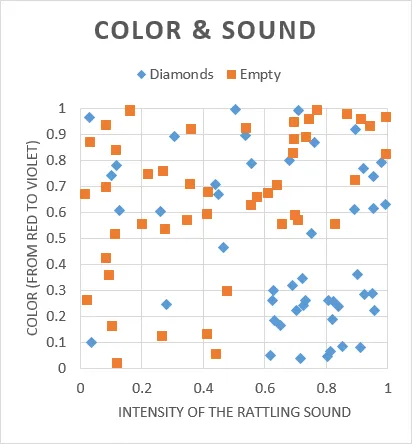
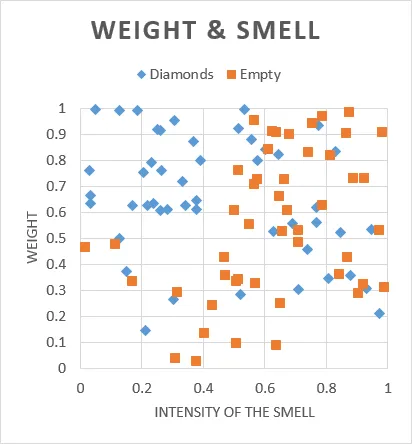
***

***
I have chosen to go with HGBT (Histogram Gradient Boosting Trees)
<br> Non-linear (uses trees), focused on minimizing the loss-function by iteratively adding trees to minimize the residual error (loss-function) on each iteration by fitting each newly added tree to the negative gradient of the loss function.
<br> it turned out a bit tricky to spin up, but here it is.
***

In [ ]:
from eli5.sklearn import PermutationImportance
from sklearn.tree import DecisionTreeRegressor             # for future selection, fast
from sklearn.feature_selection import RFECV
from sklearn.model_selection import TimeSeriesSplit        # no cheating for timeseries, no data leaks through time, forward view only
from sklearn.ensemble import HistGradientBoostingRegressor # works only for 1 output, so will make 10 for 10 outputs
from sklearn.multioutput import MultiOutputRegressor       # with this wrapper for multiple output.
from sklearn.model_selection import KFold # inner fold splitter for PermutationImportance (for features selection)

splitter = TimeSeriesSplit(n_splits = 3,
                     gap=56, # we have features with lag 60. no a chance for data leaking.
                     )
estimator = DecisionTreeRegressor()
feature_selector = RFECV(
    PermutationImportance(estimator,
                          scoring='neg_root_mean_squared_error',
                          n_iter=2,
                          cv=KFold(2)), # inner fold splitter
    min_features_to_select=100,
    step=25,
    scoring='neg_root_mean_squared_error',
    cv=splitter)  # outer fold splitter

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
%%time
fit = feature_selector.fit(x,y)

In [ ]:
best_feature_names_nonlinearity = fit.get_feature_names_out().tolist()
print(f'Filtered {len(best_feature_names_nonlinearity)} features as best combo of subspaces\nList:')
for s in best_feature_names_nonlinearity:
  print(s)

Filtered 115 features as best combo of subspaces
List:
dt_doy
3
target
4_1
target_1
4_2
target_2
dt_doq_3
3_3
target_3
3_4
target_4
target_5
1_6
target_6
1_7
target_7
dt_dow_8
target_8
dt_dom_9
dt_doy_9
3_9
target_9
dt_doq_10
4_10
target_10
3_11
target_11
4_12
target_12
1_13
4_13
target_13
3_15
target_16
4_17
target_17
target_18
dt_woq_19
4_19
target_19
dt_doq_20
target_20
dt_doq_21
4_21
target_21
dt_wom_22
target_22
4_23
target_23
3_24
4_25
dt_dom_26
target_26
dt_dow_27
4_27
dt_doy_28
target_28
dt_doq_29
target_29
target_30
4_31
target_31
target_32
dt_doy_33
3_34
dt_dom_35
target_35
4_36
target_36
dt_dow_37
4_37
target_37
dt_dom_38
target_38
target_39
dt_doy_40
target_40
3_41
target_41
dt_dom_43
dt_dom_44
1_44
3_44
4_44
target_44
3_45
target_45
3_46
4_46
target_46
target_47
target_48
dt_doq_50
4_50
4_51
target_51
4_52
target_52
target_53
dt_doy_54
4_54
target_54
dt_doy_55
target_55
dt_dom_56
dt_doq_56
target_56
dt_doq_57
4_57
target_57
1_58
target_59
dt_doy_60
target_60


# Model selection

***
<br>now prepare data a bit for model selection.
***

In [ ]:
# drop unused features
x_train = x_train[best_feature_names_nonlinearity].copy() #copy will create new data so we get rid of SettingWithCopyWarning
x_test = x_test[best_feature_names_nonlinearity].copy() #copy will create new data so we get rid of SettingWithCopyWarning

#remake normalizers (they will act the same but for x it's necessary coz of different shape now)
normalizer_features = StandardScaler()
normalizer_features = normalizer_features.fit(x_train)

x_train.loc[:,:] = normalizer_features.transform(x_train)
x_test.loc[:,:] = normalizer_features.transform(x_test)


normalizer_target = StandardScaler()
normalizer_target = normalizer_target.fit(y_train)

y_train.loc[:,:] = normalizer_target.transform(y_train)
y_test.loc[:,:] = normalizer_target.transform(y_test)

***
Model selection using selected features
***

In [ ]:
%%time
from sklearn.model_selection import GridSearchCV

model = MultiOutputRegressor(
    HistGradientBoostingRegressor(loss = 'squared_error', scoring='neg_mean_squared_error') #'neg_root_mean_squared_error')
)

params = { 'estimator__max_iter': [2000, 10000], # <- do not lower this. rmse|mse responds inadequately, we need to have a lot of trees (>=1000) in grad.boosting to fit residuals & to have soft (generalizable) topology from ensemble of shallow trees
           'estimator__max_depth': [2, 100], # <- complexity
           'estimator__max_leaf_nodes': [2, 10], # <-max samples each tree can use (i.e. and to memory)
           'estimator__learning_rate': [0.5], # <-multiplicative for amplitude (e.g. to output variance scale)
           'estimator__min_samples_leaf': [30, 1000], # <-the bigger value the bigger clusters (e.g. localy coorelated densities and in theory more stable with big ensemble bagging) but must be less then a 1/2-1/3 of minimum possible batch (cv)
           'estimator__l2_regularization': [0.0, 1e-5] # <- L2
           } # 2^5=32.. optuna?

cv = TimeSeriesSplit(n_splits = 3,
                     gap=56, # we have feature with lag 56. no a chance for data leaking.
                     )

grid_result = GridSearchCV(
    estimator = model,
    param_grid = params,
    return_train_score = True,
    cv = cv,
    scoring='neg_mean_squared_error', #'neg_root_mean_squared_error',
).fit(x_train, y_train)

CPU times: user 3h 39min 28s, sys: 3min 21s, total: 3h 42min 50s
Wall time: 2h 12min 16s


In [ ]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***
Validation
***

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

model_test = MultiOutputRegressor(
    HistGradientBoostingRegressor(loss = 'squared_error', scoring='neg_root_mean_squared_error',
                                  **dict([(k[len('estimator__'):],v) for k,v in grid_result.best_params_.items()]) # selected model params from above
                                  # **{'learning_rate': 0.5, 'max_iter': 20000, 'max_leaf_nodes': 2, 'max_depth': 100, 'min_samples_leaf': 1000}
                                  # **{'learning_rate': 0.5, 'max_iter': 40000, 'max_leaf_nodes': 2, 'max_depth': 100, 'min_samples_leaf': 1000}
                                  # **{'learning_rate': 0.5, 'max_iter': 60000, 'max_leaf_nodes': 2, 'max_depth': 100, 'min_samples_leaf': 1000}
                                  )
)

# don't forget about gap of 56 steps to leave for leakage safety
model_test.fit(x_train.iloc[:-56,:], y_train.iloc[:-56,:])

predictions = model_test.predict(x_test)

In [ ]:
print('train MAE=', mean_absolute_error(y_train.iloc[:-56,:], model_test.predict(x_train.iloc[:-56,:])))
print('train MSE=', mean_squared_error(y_train.iloc[:-56,:], model_test.predict(x_train.iloc[:-56,:])))
print('test MAE=', mean_absolute_error(y_test, predictions))
print('test MSE=', mean_squared_error(y_test, predictions))

train MAE= 0.5252909593028409
train MSE= 0.645078995162348
test MAE= 0.8918432849057518
test MSE= 1.450829886493941


***
Now let's find a way to visualize best, mean and worst cases
***

In [ ]:
# row-wise MSE err
p_error = np.mean((predictions - y_test.values)**2, axis=1, keepdims=True) # shape [10,1]
p_error = pd.DataFrame(p_error, columns=['p_err',])
p_pred = pd.DataFrame(predictions, columns=[ 'p_'+i for i in list(y_test.columns) ])
# now presave index from test df and join by default rangeindex and re-set index back
# coz we will need to get last real target value (not the 1st derivative that we are using)
df_forecast = y_test.copy().reset_index() # presaved old index as column and got def range index to concat newbies
df_forecast = pd.concat([df_forecast, p_pred, p_error], axis=1) # concat by def rande index
df_forecast = df_forecast.set_index('index') # re-set original index back in charge (now we can join with original data by rows)


col_names_b_act = ['b',]+list(y_test.columns) # [b]+[column_names_of_fact_values]
col_names_b_frc = ['b',]+['p_'+i for i in list(y_test.columns)] # [b]+[column_names_of_forecasted_values]

# df_presaved_1. sorry i just in hurry now. we just need initial antiderivative to chain forecast from it.
df_forecast = pd.concat([df_presaved_1[['Date','target']].rename({'target':'b'}, axis=1), df_forecast], axis=1).dropna()
df_forecast.loc[:,col_names_b_act[1:]] = normalizer_target.inverse_transform(df_forecast.loc[:,col_names_b_act[1:]])
df_forecast.loc[:,col_names_b_frc[1:]] = normalizer_target.inverse_transform(df_forecast.loc[:,col_names_b_frc[1:]])

In [ ]:
# now we can chain from 'b' original 1st derivative and the predicted 1st derivative to get actual and forecasted values
df_forecast.loc[:,col_names_b_act] =\
  df_forecast.loc[:,col_names_b_act].cumsum(axis=1)
df_forecast.loc[:,col_names_b_frc] =\
  df_forecast.loc[:,col_names_b_frc].cumsum(axis=1)

In [ ]:
# sort asc MSE
df_forecast.sort_values(by='p_err',inplace=True)
# get 3 cases
best_forecast = df_forecast.iloc[:1,:]
worst_forecast = df_forecast.iloc[-1:,:]
median_forecast = df_forecast.iloc[ (len(df_forecast)//2) : (1+len(df_forecast)//2),  :  ]

best forecast


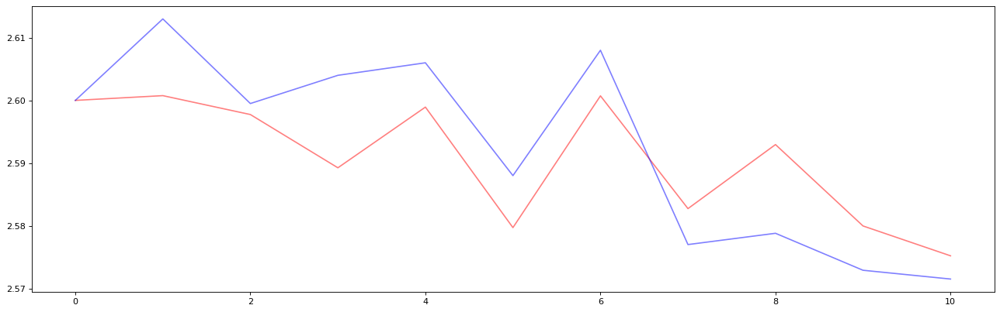

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
print('best forecast')
figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(range(len(best_forecast[col_names_b_frc].values.reshape(-1))),
         best_forecast[col_names_b_frc].values.reshape(-1),
         color='red', alpha=0.5) # forecast red
plt.plot(range(len(best_forecast[col_names_b_act].values.reshape(-1))),
         best_forecast[col_names_b_act].values.reshape(-1),
         color='blue',  alpha=0.5) # actual blue
plt.show()

median forecast


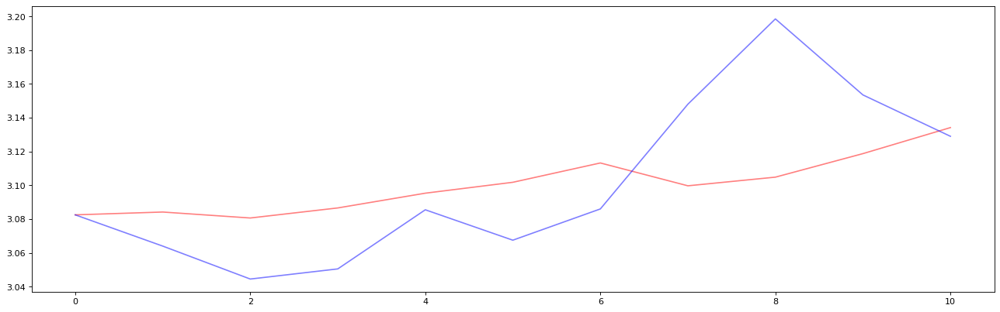

In [ ]:
print('median forecast')
figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(range(len(median_forecast[col_names_b_frc].values.reshape(-1))),
         median_forecast[col_names_b_frc].values.reshape(-1),
         color='red', alpha=0.5) # forecast red
plt.plot(range(len(median_forecast[col_names_b_act].values.reshape(-1))),
         median_forecast[col_names_b_act].values.reshape(-1),
         color='blue',  alpha=0.5) # actual blue
plt.show()

worst forecast


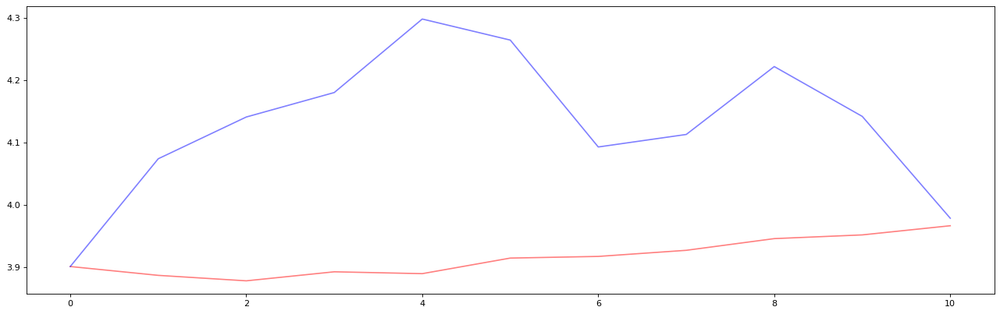

In [ ]:
print('worst forecast')
figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(range(len(worst_forecast[col_names_b_frc].values.reshape(-1))),
         worst_forecast[col_names_b_frc].values.reshape(-1),
         color='red', alpha=0.5) # forecast red
plt.plot(range(len(worst_forecast[col_names_b_act].values.reshape(-1))),
         worst_forecast[col_names_b_act].values.reshape(-1),
         color='blue',  alpha=0.5) # actual blue
plt.show()

# Conclusion, ideas on how to improve from what I have experienced through the task.
***
First of all thank you, it was interesting data to play with it. I have tried to show all my way along step by step through the task with comments. The data itself turned out not just easy one to forecast. I went through more than just shown model for forecasting and can conclude that it worth to work more with the initial data and to extract more features. Ofcourse it would be great to improve. Here some ideas. 👍
***
1. Data.
<br> use more sources of data with more frequence density. Also we MUST apply better imputation techniques (e.g. KNN imputing or "kriging"). And I think it worth to interpolate missing Dates also and to switch to forecast by Dates rather than steps. We can also add some text features for NLP (i.e. semantic analisys on news to get features like are news positive or negative (BERT will help I have used it))
<br>
2. Features.
<br> Need more. Sliding window with statistics, MACD, MAE, Stochastic and other relevant financial tech.indicators with different combinations of hyperparameters (I do remember how was it when I was built my first autotrade). So we can push them through feature selection pipe. I would actually build a pipe that would nearly constantly work on that with lightweight model-wrappers. So we would collect relevant base projections as features, and use top of ranked heap of them with lighter models instead of using heavy models each time on inference. Plus we may apply oldschool SVD/PCA or encoder-decoder with bottleneck (useful embedding is just in the middle in that bottleneck) to squize the dimensionality after. Ah yes and we can use Optuna for hyperparams search (feature selection, model selection, etc) it searches more effectively in bigger spaces of params.
<br>
3. Modelling.
<br>Worth to try in that order (from simple to more complex):
<br>_0. Get back from 1st derivative back to original values for target, since HGBT is a tree-based model
<br>_1. SARIMA on target + HGBT|xgboost for residuals over it
<br>_2. ANNs with TF/Keras pipes (e.g. keras-tuner for architecture selection (I'm good with ANNs on TF and Keras))
<br>_3. TinyTimeMixers (foundation zero-shot forecasts)
<br>_4. Chronos (foundation zero-shot forecasts)
<br>Also... It is actually possible novadays to build a pipe with LLM as an agent in a loop for constantly searching for features or ANN architectures and other generative tasks that can potentialy help (nvidia actively developing so-called applied 'nims', some other devs also presenting some agent-based applied automations).
***